<a href="https://colab.research.google.com/github/ameliapuspa/YOLOV8-Vehicle-Detection/blob/main/Vehicle_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import zipfile
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
import numpy as np

SEED = 23
np.random.seed(SEED)

Download the Dataset

In [2]:
os.makedirs('datasets', exist_ok=True)

In [3]:
%cd datasets

/content/datasets


In [4]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
      file = requests.get(url)
      open(save_name, 'wb').write(file.content)

download_file(
    'https://universe.roboflow.com/ds/xoHyLRV4XM?key=OwAYHlvFXk',
    'vehicle_detection_yolov8.zip'
)

In [5]:
#Unzip the dataset
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print ("Extracted all")
    except:
        print("Invalid file")

unzip('vehicle_detection_yolov8.zip')

Extracted all


In [17]:
class_names = ['Bus', 'Car', 'Lorry', 'Motorcycle', 'Van', 'bus']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

Visualize Images From the Dataset

In [18]:
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0] - bboxes[2]/2, bboxes[1] - bboxes[3]/2
    xmax, ymax = bboxes[0] + bboxes[2]/2, bboxes[1] + bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [19]:
def plot_box(image, bboxes, labels):
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin

        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color = colors[class_names.index(class_name)],
            thickness = 2
        )

        font_scale = min(1,max(3, int(w/500)))
        font_thickness = min(2, max(10, int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        #Text width and height
        tw, th = cv2.getTextSize(
            class_name,
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] +tw, p1[1] + -th - 10
        cv2.rectangle(
            image,
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1
        )
        cv2.putText(
            image,
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_COMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [20]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

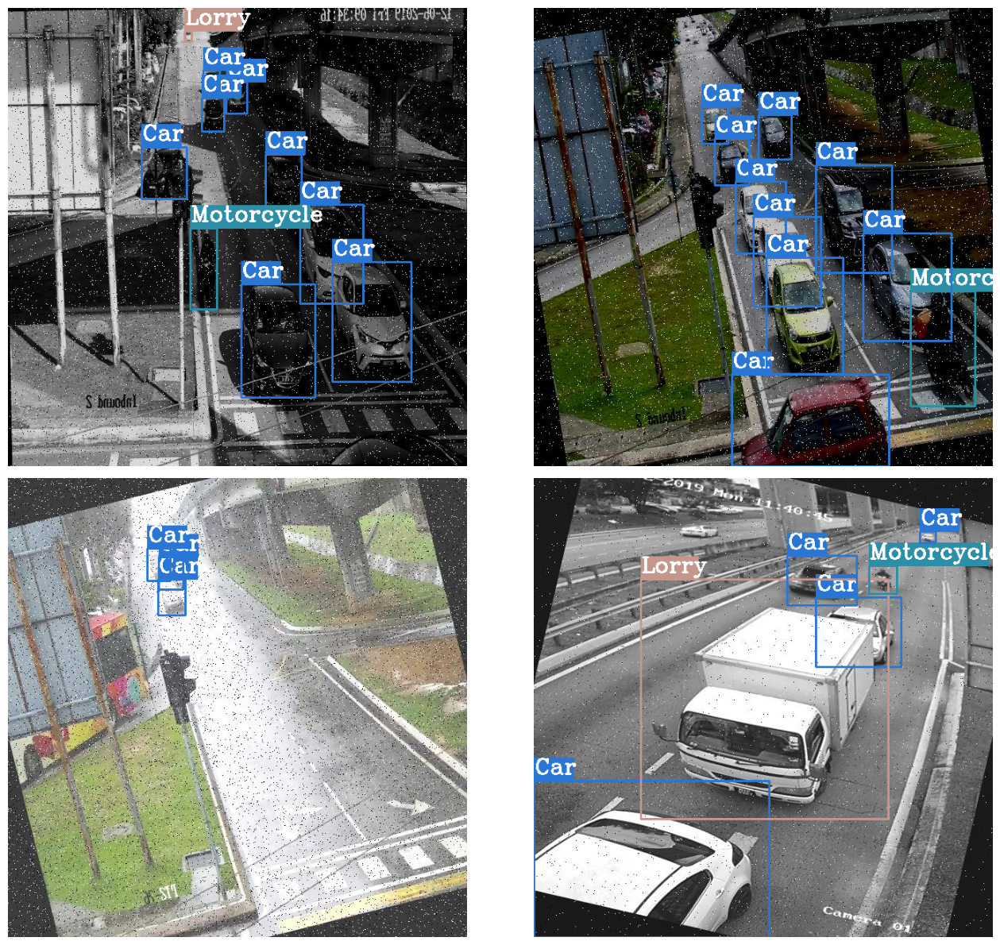

In [21]:
# Visualize a few training images.
plot(
    image_paths='train/images/*',
    label_paths='train/labels/*',
    num_samples=4,
)

In [22]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [23]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/detect

In [24]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.9/645.9 kB 5.4 MB/s eta 0:00:00


YOLOV8s Training

In [26]:
monitor_tensorboard()

<IPython.core.display.Javascript object>

In [27]:
EPOCHS = 20
!yolo task=detect mode=train model=yolov8s.pt data=data.yaml epochs={EPOCHS} batch=8 name=yolov8s_v8_50e

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=20, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8s_v8_50e2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, k

Evaluation on Validation Images

In [28]:
!yolo task=detect mode=val model=runs/detect/yolov8s_v8_50e2/weights/best.pt data=data.yaml name=yolov8s_eval

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127906 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/valid/labels.cache... 29 images, 1 backgrounds, 0 corrupt: 100% 29/29 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 59, len(boxes) = 347. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:03<00:00,  1.61s/it]
                   all         29        347       0.77      0.431      0.485      0.353
                   Bus         29          3      0.358      0.333      0.217       0.19
                   Car         29        289        0.9      0.779       0.84      0.633
                 Lorry         29          8      

Inference on Validation Images

In [29]:
!yolo task=detect mode=predict model=runs/detect/yolov8s_v8_50e2/weights/best.pt source=/content/datasets/valid/images imgsz=640 name=yolov8s_infer show_labels=True

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127906 parameters, 0 gradients, 28.4 GFLOPs

image 1/29 /content/datasets/valid/images/OYH-cam1_552_jpg.rf.e34ee5947c5da5f70cee0d0741a11ed9.jpg: 640x640 1 Bus, 13 Cars, 2 Motorcycles, 22.6ms
image 2/29 /content/datasets/valid/images/cam73_cam73-20191122-2203-04_jpg.rf.902527d0ec8137700d250767cf058031.jpg: 640x640 9 Cars, 1 bus, 21.6ms
image 3/29 /content/datasets/valid/images/cam73_cam73-20191122-2203-05_jpg.rf.e7e489f1e30d1a35c88ce7edb3d48c12.jpg: 640x640 11 Cars, 1 Motorcycle, 1 bus, 16.3ms
image 4/29 /content/datasets/valid/images/cam73_cam73-20191124-0810-06_jpg.rf.099645ec7e2f202b022fe78791da0e61.jpg: 640x640 1 Bus, 6 Cars, 1 bus, 16.2ms
image 5/29 /content/datasets/valid/images/cam73_cam73-20191125-0849-03_jpg.rf.0217cf290860f80301ebb87daa016d88.jpg: 640x640 21 Cars, 4 Motorcycles, 1 bus, 16.3ms
image 6/29 /content/datasets/valid/images/cam76_cam76-20191129

Visualize Validation Results

In [30]:
def visualize(result_dir, num_samples=4):
    """
    Function accepts a list of images and plots
    them in a 2x2 grid.
    """
    plt.figure(figsize=(20, 12))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()

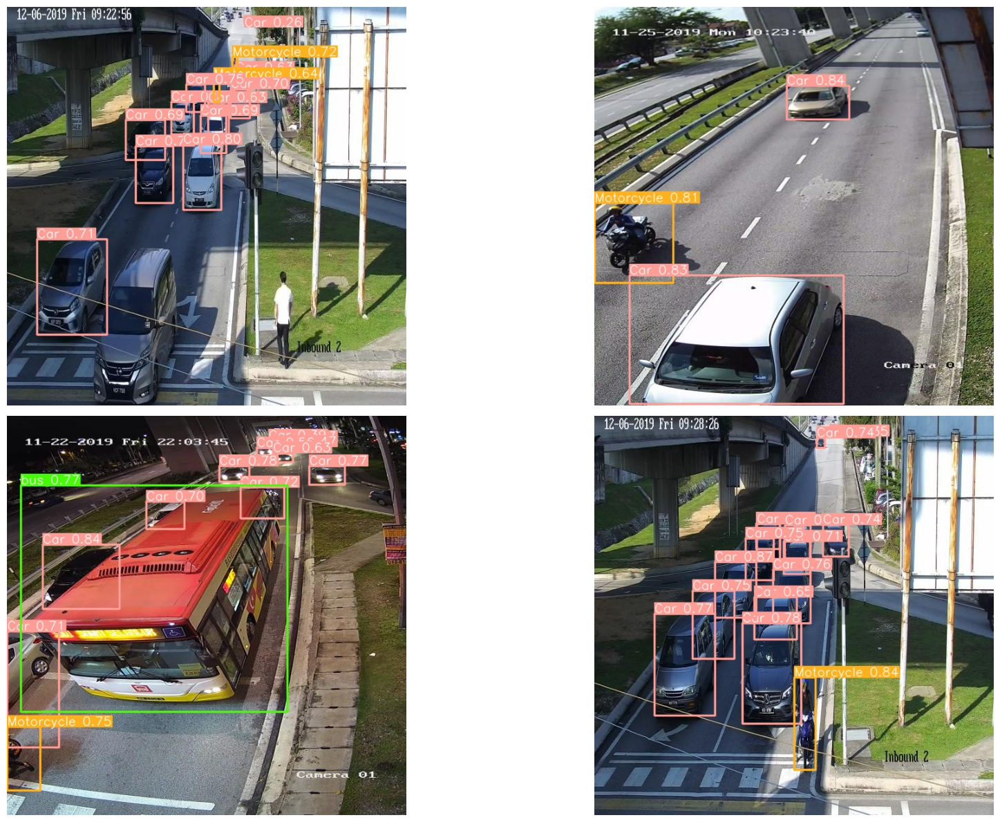

In [31]:
visualize('/content/datasets/runs/detect/yolov8s_infer')